## Pre Task --- JuliAccel.jl

- [ ] Make sure the path given to the activate function leads to the JuliAccel.jl Folder on your system.
- [ ] Make sure the files "pam-09.japd" and "pam-09.mad" are in the same location as this notebook
- [ ] run the cells in the Pre Task. The last cell should give you a positive message, if everything is fine.

In [1]:
import Pkg

In [2]:
# TODO: use the correct path for your system

Pkg.activate("../../../juliaccel.jl/")
## TODO: install LaTeXStrings if necessary
#Pkg.add("LaTeXStrings")

  Activating project at `~/Polybox/ETH/ParticleAcceleratorModelling/juliaccel.jl`


In [3]:
### A basic setup


print("Importing packages... ")
using JuliAccel
using LaTeXStrings
using Plots
using ProgressBars

using Dates

println("Done!")


# =======================================================================

# VARIABLES

# Initial coordinates
ξi = [1.0, 0.0, 0.0, 0.0, 0.0, 0.0]

# Beamline data files
# TODO make sure they are downloaded and in the same folder as the notbook!
mad  = "pam-09sol.mad"
prob = "pam-09sol.japd"

# PROBLEM DEFINITION

print("Defining problem... ")

# Compute maps
Ms  = gen_maps(mad, prob, symplectic=true)
Mn = gen_maps(mad, prob, symplectic=false)

println("Done!")


Importing packages... 

[ Info: Precompiling UnitfulExt [0e51ec96-f580-5f12-a625-1297083d7970] (cache misses: wrong dep version loaded (4))


Done!
Defining problem... 

0.0%┣                                                ┫ 0/5 [00:00<00:00, -0s/it]
20.0%┣████████▋                                  ┫ 1/5 [00:04<Inf:Inf, InfGs/it]
40.0%┣███████████████████▏                            ┫ 2/5 [00:06<00:18, 6s/it]
60.0%┣████████████████████████████▉                   ┫ 3/5 [00:08<00:08, 4s/it]
80.0%┣██████████████████████████████████████▍         ┫ 4/5 [00:10<00:03, 3s/it]
100.0%┣███████████████████████████████████████████████┫ 5/5 [00:12<00:00, 3s/it]
100.0%┣███████████████████████████████████████████████┫ 5/5 [00:12<00:00, 3s/it]
0.0%┣                                                ┫ 0/5 [00:00<00:00, -0s/it]
20.0%┣████████▋                                  ┫ 1/5 [00:00<Inf:Inf, InfGs/it]
40.0%┣███████████████████▏                            ┫ 2/5 [00:01<00:03, 1it/s]
60.0%┣████████████████████████████▉                   ┫ 3/5 [00:01<00:01, 2it/s]
80.0%┣██████████████████████████████████████▍         ┫ 4/5 [00:02<00:01, 2it/s]


Done!


100.0%┣███████████████████████████████████████████████┫ 5/5 [00:02<00:00, 2it/s]
100.0%┣███████████████████████████████████████████████┫ 5/5 [00:02<00:00, 2it/s]


In [5]:
# Focusing Quadrupole (half strength)
println("Focusing Quadrupole")
MsFoc = Ms[1]
MnFoc = Mn[1]
RsFoc = TaylorSeries.jacobian(MsFoc)
RnFoc = TaylorSeries.jacobian(MnFoc)
display(RsFoc)
#display(RnFoc)
# Drift Space
println("Drift Space")
MsDrift = Ms[2]
MnDrift = Mn[2]
RsDrift = TaylorSeries.jacobian(MsDrift)
RnDrift = TaylorSeries.jacobian(MnDrift)
display(RsDrift)
#display(RnDrift)
# Defocusing Quadrupole
println("Defocusing Quadrupole")
MsDefoc = Ms[3]
MnDefoc = Mn[3]
RsDefoc = TaylorSeries.jacobian(MsDefoc)
RnDefoc = TaylorSeries.jacobian(MnDefoc)
display(RsDefoc)
#display(RnDefoc)

@assert RsDrift == TaylorSeries.jacobian(Ms[4]) "Drifts are not the same..."
@assert RsFoc == TaylorSeries.jacobian(Ms[5]) "Focusing Quadrupoles are not the same"
println("Second Drift and Second Focusing Matrices are the samen\n")

Rs = RsFoc * RsDrift * RsDefoc * RsDrift * RsFoc
Rn = RnFoc * RnDrift * RnDefoc * RnDrift * RnFoc
println("FODO Cell")
display(Rs)
display(Rn)

Focusing Quadrupole


6×6 transpose(::Matrix{Float64}) with eltype Float64:
  1.0       1.0e-6  0.0       0.0     0.0  0.0
 -0.353553  1.0     0.0       0.0     0.0  0.0
  0.0       0.0     1.0       1.0e-6  0.0  0.0
  0.0       0.0     0.353553  1.0     0.0  0.0
  0.0       0.0     0.0       0.0     1.0  4.45401e-6
  0.0       0.0     0.0       0.0     0.0  1.0

Drift Space


6×6 transpose(::Matrix{Float64}) with eltype Float64:
 1.0  0.6  0.0  0.0  0.0  0.0
 0.0  1.0  0.0  0.0  0.0  0.0
 0.0  0.0  1.0  0.6  0.0  0.0
 0.0  0.0  0.0  1.0  0.0  0.0
 0.0  0.0  0.0  0.0  1.0  2.67241
 0.0  0.0  0.0  0.0  0.0  1.0

Defocusing Quadrupole


6×6 transpose(::Matrix{Float64}) with eltype Float64:
 1.0       1.0e-6   0.0       0.0     0.0  0.0
 0.707107  1.0      0.0       0.0     0.0  0.0
 0.0       0.0      1.0       1.0e-6  0.0  0.0
 0.0       0.0     -0.707107  1.0     0.0  0.0
 0.0       0.0      0.0       0.0     1.0  4.45401e-6
 0.0       0.0      0.0       0.0     0.0  1.0

Second Drift and Second Focusing Matrices are the samen

FODO Cell


6×6 Matrix{Float64}:
  0.91     1.45456   0.0      0.0       0.0  0.0
 -0.11818  0.91      0.0      0.0       0.0  0.0
  0.0      0.0       0.91     0.945444  0.0  0.0
  0.0      0.0      -0.18182  0.91      0.0  0.0
  0.0      0.0       0.0      0.0       1.0  5.34482
  0.0      0.0       0.0      0.0       0.0  1.0

6×6 Matrix{Float64}:
  0.91     1.45456   0.0      0.0       0.0  0.0
 -0.11818  0.91      0.0      0.0       0.0  0.0
  0.0      0.0       0.91     0.945444  0.0  0.0
  0.0      0.0      -0.18182  0.91      0.0  0.0
  0.0      0.0       0.0      0.0       1.0  5.34482
  0.0      0.0       0.0      0.0       0.0  1.0

In [6]:
mad_parsed = JuliAccel.parse_madx(mad)

prob_set = JuliAccel.extract_model_data(prob)

ekin = mad_parsed.beam["energy"]
particle = (mad_parsed.beam["particle"] == "electron") ? Electron() : Proton()

γ = get_gamma(ekin, particle.mass)
β0 = get_beta(γ)
c = 3e8

P0 = γ * β0 * particle.mass/c # *1e6#/c


### Checking your setup

if(prob_set.hamiltonians[1]["type"]== "drift" && mad_parsed.lattice[2]["type"] == "drift")
    println("Your set up should be fine! Good luck with the exercise sheet")
else
    println("WARNING!!! Something seems to be wrong with your setup. Please, check the Pre-Task steps and maybe problem set 7")
end


Your set up should be fine! Good luck with the exercise sheet


In [7]:
### Creation of a initial bunch

N_part = 1000 # number of particles

μ = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Σ = [16.0 0.0 0.0 0.0 0.0 0.0;
     0.0 1.0 0.0 0.0 0.0 0.0;
     0.0 0.0 16.0 0.0 0.0 0.0;
     0.0 0.0 0.0 1.0 0.0 0.0;
     0.0 0.0 0.0 0.0 0.709 0.0;
     0.0 0.0 0.0 0.0 0.0 0.0981]

D = Gaussian(μ, Σ)

Γi = gen_distribution(D, N_part)


6×1000 Matrix{Float64}:
 -6.66098     2.931      -2.38359    …  -5.47663     -1.122      6.64215
 -0.0357119  -0.0500905   0.385237       1.21051     -0.892662  -0.342357
  1.64551     4.11537     2.03637        3.20496      9.95265    2.79927
  1.01314     3.05568     1.13782       -0.344334    -0.9147    -0.345675
  0.499362   -0.981701    0.857058      -0.00165485   0.982459  -0.332897
  0.295392   -0.0825792   0.0822095  …  -0.0338758   -0.169705  -0.173361

## Task 1 - FODO cell

We are given a FODO cell. Implement a FODO Cell with $L= 1m$ and a focal length of $f_0 = \sqrt{2}$.
<font color='red'>The L was changed to $L=0.6m$ to make the solution stable.</font>

A FODO cell contains:
 - A thin length focusing quadrupole with focal length 2f0​: Qf​(L=0,f=2f0​)
 - A drift with length L: Dr(L)
 - A think length defocusing quadrupole with focal length −f0​: Qd​(L=0,f=−f0​) A drift with length L: Dr(L)
 - A thin length focusing quadrupole with focal length 2f0​: Qf​(L=0,f=2f0​)


### Task 1

- [ ] Derive the focusing strengths $κ_f$ and $κ_d$ of the focusing and defocusing quadropole

In [8]:
#k1 * Lq

In [9]:
# Solution

Lq = 1e-6
f0 = sqrt(2)

# Qf
ff = 2*f0
kf = 1/(ff*Lq)


println(kf)

# D
L = 1.0

# Qd
fd = -f0
kd = 1/(fd*Lq)

println(kd)



353553.39059327374


LoadError: cannot assign a value to imported variable Base.fd from module Main

## Task 2 - Thin Quadropole
Consider a very thin quadropole $L=1e^{-6} m$ (for example).

### Task 2.1
- [ ] Calculate gradB from the parameter: $f_0=1.5$.



In [16]:

### Solution from here

L = 1e-6
f0 = 1.5
k1 = 1/(f0*L)
gradB = 1.0/(P0 * k1)



1.0121834945312032e-6

### Task 2.2 
- [ ] Compute the TPSE and evolve the bunch

In [17]:
# Truncation orders
n1 = 3
n2 = 6
n_max = n2 * (n1-1) + 1
pp = eval(:(@set_problem("x px y py z δ", $n1, $n2, $n_max)))

### Solution from here

# Hamiltonian
Htq = δ/β0 - sqrt((1/β0 + δ)^2 - px^2 - py^2 - 1/(β0^2 * γ^2)) + 1/2*k1*(x^2-y^2)


# TPSE
Htq_tpse = tps_expansion!(Htq)

M_thinQ = lie_transform(-L*Htq_tpse, pp)

6-element Vector{TaylorN{Float64}}:
                                                                                                                                                                                                                                                                                                                                                    0.9999996666666852 x + 9.999998888888929e-7 px + 7.78460558295854e-7 x δ - 2.335381415400698e-6 px δ + 1.010001558481832e-13 x δ² - 6.060009148890667e-13 px δ² + 5.241643445817329e-21 x δ³ - 4.717479101235597e-20 px δ³ + 𝒪(‖x‖¹⁴)
                                                                                                                                                                                                                                                                                                                                                                                - 0.666666592592595 x + 0.

In [18]:
TaylorSeries.jacobian(M_thinQ)

6×6 transpose(::Matrix{Float64}) with eltype Float64:
  1.0       1.0e-6  0.0       0.0     0.0  0.0
 -0.666667  1.0     0.0       0.0     0.0  0.0
  0.0       0.0     1.0       1.0e-6  0.0  0.0
  0.0       0.0     0.666667  1.0     0.0  0.0
  0.0       0.0     0.0       0.0     1.0  4.45401e-6
  0.0       0.0     0.0       0.0     0.0  1.0

In [19]:
### Solution

Γ_thinq =  copy(Γi)

ξt = Matrix{Float64}(undef, 6, length(Ms))

for p in range(1,N_part)
    ξt = copy(Γi[:,p])
        ξt = M_thinQ(ξt)
    Γ_thinq[:,p] = copy(ξt)
end

Γ_thinq

6×1000 Matrix{Float64}:
 -3.79227   -4.60814   -5.56339   …  -0.414343    3.1086      0.742761
 -0.547367   2.51246    3.61388       0.0159879  -1.52674    -0.612983
  1.97201   -6.83456   -3.35484       4.84998     4.33663    -0.566338
  1.43206   -2.96248   -0.483918      4.05425     1.80196    -0.568549
 -2.00312   -0.73504    0.378259     -0.0950823  -0.0835057   0.390862
  0.60744   -0.272076  -0.200763  …   0.376219   -0.253965   -0.15677

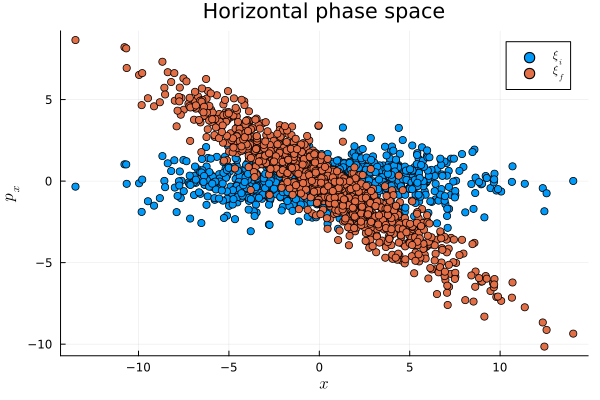

In [20]:
x_i = Γi[1,:]
px_i = Γi[2,:]

x_f = Γ_thinq[1,:]
px_f = Γ_thinq[2,:]

plot(x_i, px_i, seriestype=:scatter, label=L"\xi_i")
plot!(x_f, px_f, seriestype=:scatter, label=L"\xi_f")
xaxis!(L"x")
yaxis!(L"p_x")
title!("Horizontal phase space")

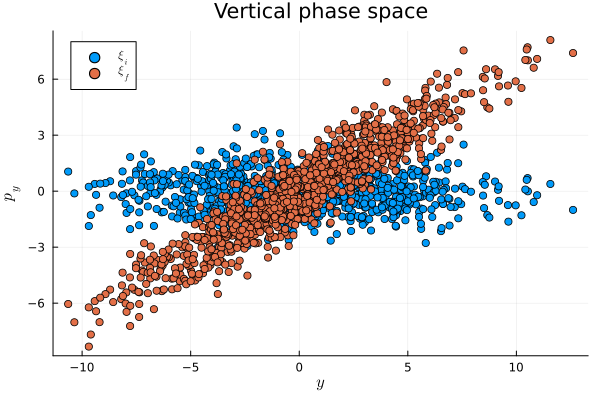

In [21]:
y_i = Γi[3,:]
py_i = Γi[4,:]

y_f = Γ_thinq[3,:]
py_f = Γ_thinq[4,:]

plot(y_i, py_i, seriestype=:scatter, label=L"\xi_i")
plot!(y_f, py_f, seriestype=:scatter, label=L"\xi_f")
xaxis!(L"y")
yaxis!(L"p_y")
title!("Vertical phase space")

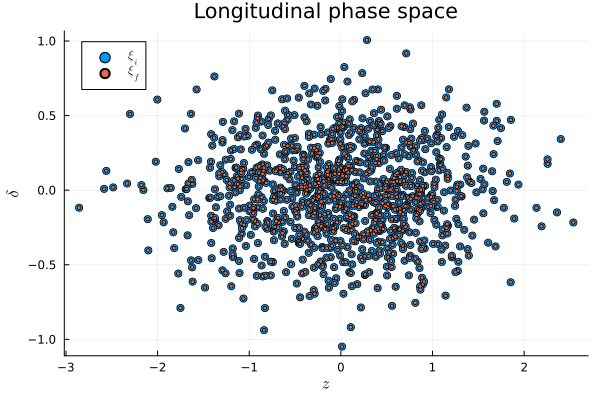

In [22]:
z_i = Γi[5,:]
δ_i = Γi[6,:]

z_f = Γ_thinq[5,:]
δ_f = Γ_thinq[6,:]

plot(z_i, δ_i, seriestype=:scatter, label=L"\xi_i")
plot!(z_f, δ_f, seriestype=:scatter, markersize=2, label=L"\xi_f")
xaxis!(L"z")
yaxis!(L"\delta")
title!("Longitudinal phase space")

## Task 3 - Implement FODO cell

Now we will continue with the FODO cell from Task 1, but use JuliAccel.jl. Using the files pam-09.mad and pam-09.japd, implement the FODO cell from Task 1. 

### Task 3.1
- [ ] Add the quadropole to the "pam-09.japd" file.

### Task 3.2
- [ ] Add the focusing and defocusing quadropoles to the "pam-09.mad" file

### Task 3.3 
- [ ] create the lattice with one full fodo cell

In [23]:
## load new maps

M_FODO = gen_maps(mad, prob, symplectic=true)

0.0%┣                                                ┫ 0/5 [00:00<00:00, -0s/it]
20.0%┣████████▋                                  ┫ 1/5 [00:05<Inf:Inf, InfGs/it]
40.0%┣███████████████████▏                            ┫ 2/5 [00:09<00:28, 9s/it]
60.0%┣████████████████████████████▉                   ┫ 3/5 [00:14<00:14, 7s/it]
80.0%┣██████████████████████████████████████▍         ┫ 4/5 [00:18<00:06, 6s/it]
100.0%┣███████████████████████████████████████████████┫ 5/5 [00:23<00:00, 6s/it]
100.0%┣███████████████████████████████████████████████┫ 5/5 [00:23<00:00, 6s/it]


5-element Vector{Vector{TaylorN{Float64}}}:
 [ 0.9999998232233308 x + 9.999998821488802e-7 px + 4.128410600693633e-7 x δ - 2.335381659147055e-6 px δ - 2.8406290704487446e-14 x δ² - 2.8406292378344025e-20 px δ² - 3.909095080063173e-21 x δ³ + 2.2113180680980907e-20 px δ³ + 1.3448624903867262e-28 x δ⁴ + 1.3448625744166008e-34 px δ⁴ + 𝒪(‖x‖¹⁰),  - 0.3535533489266107 x + 0.9999998232233308 px - 4.8653778831656496e-8 x δ + 4.128410438514215e-7 px δ + 1.0043140984547401e-14 x δ² - 2.8406290704487446e-14 px δ² + 4.606912098940815e-22 x δ³ - 3.90909492649929e-21 px δ³ - 4.754807213759077e-29 x δ⁴ + 1.344862490386728e-28 px δ⁴ + 𝒪(‖x‖¹⁰),  1.0000001767767213 y + 1.0000001178511407e-6 py - 4.1284114115901375e-7 y δ - 2.3353822096018553e-6 py δ - 2.8406300747629575e-14 y δ² - 2.8406299073772106e-20 py δ² + 3.9090958478820314e-21 y δ³ + 2.2113185893108155e-20 py δ³ + 1.3448629658675012e-28 y δ⁴ + 1.344862886620684e-34 py δ⁴ + 𝒪(‖x‖¹⁰),  0.35355343225994407 y + 1.0000001767767213 py - 4.865380176727

### Task 3.4

- [ ] Evolve the Gaussian bunch through the FODO cells

In [24]:

## TODO 
## evolve Γ using M_Fodo 

#....
### apply M...
#...

#Γf = ... ### final states

# solution from here 
N = length(Ms)

Γf = copy(Γi)

ξt = Matrix{Float64}(undef, 6, length(Ms))


for p in range(1,N_part)
    ξt = copy(Γi[:,p])
    for n in range(1,N)
        ξt = Ms[n](ξt)
    end
    Γf[:,p] = copy(ξt)
end



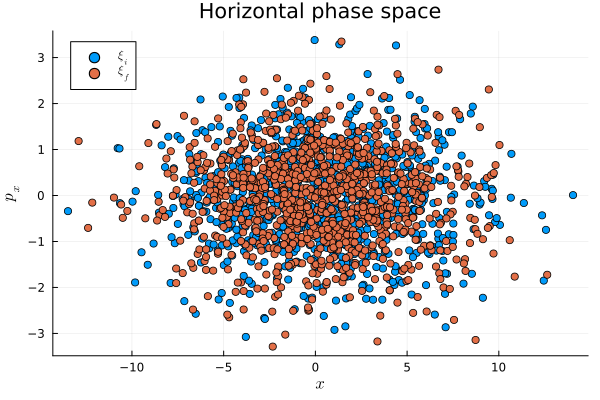

In [25]:
x_i = Γi[1,:]
px_i = Γi[2,:]

x_f = Γf[1,:]
px_f = Γf[2,:]

plot(x_i, px_i, seriestype=:scatter, label=L"\xi_i")
plot!(x_f, px_f, seriestype=:scatter, label=L"\xi_f")
xaxis!(L"x")
yaxis!(L"p_x")
title!("Horizontal phase space")

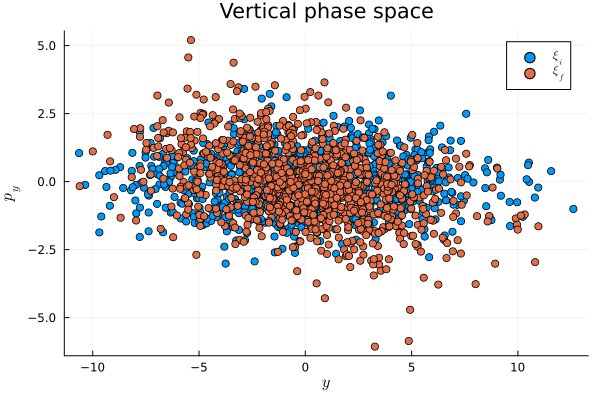

In [26]:
y_i = Γi[3,:]
py_i = Γi[4,:]

y_f = Γf[3,:]
py_f = Γf[4,:]

plot(y_i, py_i, seriestype=:scatter, label=L"\xi_i")
plot!(y_f, py_f, seriestype=:scatter, label=L"\xi_f")
xaxis!(L"y")
yaxis!(L"p_y")
title!("Vertical phase space")

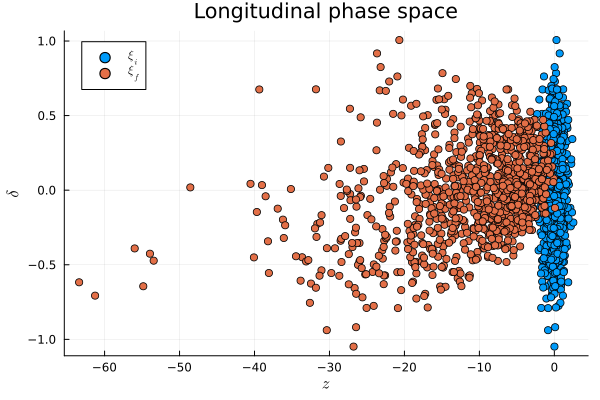

In [27]:
z_i = Γi[5,:]
δ_i = Γi[6,:]

z_f = Γf[5,:]
δ_f = Γf[6,:]

plot(z_i, δ_i, seriestype=:scatter, label=L"\xi_i")
plot!(z_f, δ_f, seriestype=:scatter, label=L"\xi_f")
xaxis!(L"z")
yaxis!(L"\delta")
title!("Longitudinal phase space")

### Task 3.5

- [ ] Propagate the bunch through the fodo 4 more times and Plot the x-px plot for each further iteration

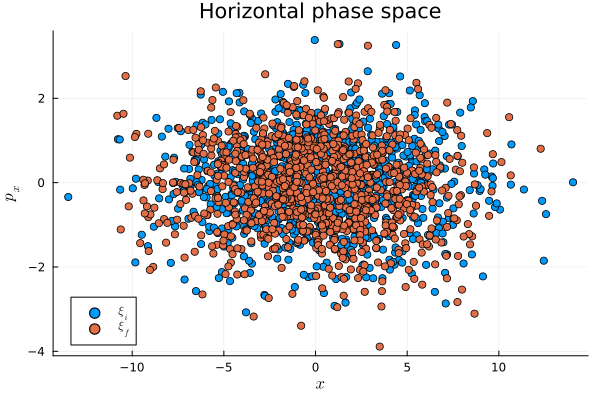

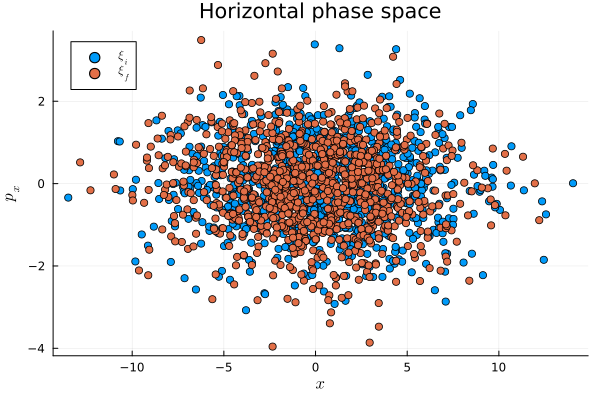

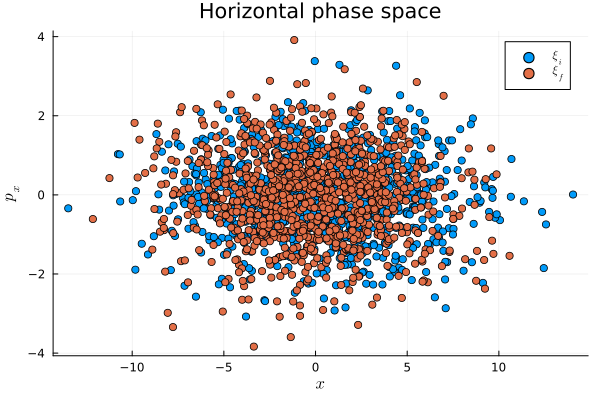

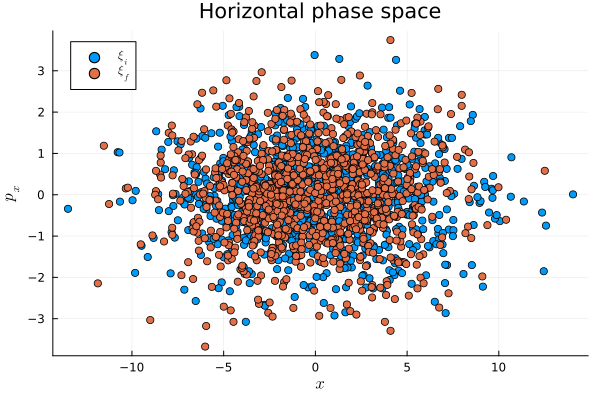

In [28]:
### Propagate 

# TODO

Γf2 = copy(Γf)

ξt = Matrix{Float64}(undef, 6, length(Ms))

for i in range(1,4)
    

    for p in range(1,N_part)
        ξt = copy(Γf2[:,p])
        for n in range(1,N)
            ξt = Ms[n](ξt)
        end
        Γf2[:,p] = copy(ξt)
    end
    
    x_i = Γi[1,:]
    px_i = Γi[2,:]
    
    x_f = Γf2[1,:]
    px_f = Γf2[2,:]
    
    plottt = plot(x_i, px_i, seriestype=:scatter, label=L"\xi_i")
    plot!(plottt, x_f, px_f, seriestype=:scatter, label=L"\xi_f")
    xaxis!(L"x")
    yaxis!(L"p_x")
    title!("Horizontal phase space")
    
    display(plottt) 
end

### Task 2.6

- [ ] Calculate the eigenvalues and eigenvectors of the accumulated matrix

In [29]:
## TODO

In [30]:
m_ac = TaylorSeries.jacobian(Ms[1])
N = length(Ms)

for i in range(2,N)
    m_ac = TaylorSeries.jacobian(Ms[i]) * m_ac
end

eig = eigen(m_ac)




Eigen{ComplexF64, ComplexF64, Matrix{ComplexF64}, Vector{ComplexF64}}
values:
6-element Vector{ComplexF64}:
  0.909999769696703 - 0.41460875431175725im
  0.909999769696703 + 0.41460875431175725im
 0.9099997803032918 - 0.41460873103199464im
 0.9099997803032918 + 0.41460873103199464im
                1.0 + 0.0im
                1.0 + 0.0im
vectors:
6×6 Matrix{ComplexF64}:
         0.0-0.0im       …  0.0+0.0im          0.0+0.0im
         0.0-0.0im          0.0+0.0im          0.0+0.0im
    0.915809-0.0im          0.0+0.0im          0.0+0.0im
 1.61314e-16-0.401613im     0.0+0.0im          0.0+0.0im
         0.0-0.0im          1.0+0.0im         -1.0+0.0im
         0.0-0.0im       …  0.0+0.0im  4.15439e-17+0.0im

In [31]:
eig.values

6-element Vector{ComplexF64}:
  0.909999769696703 - 0.41460875431175725im
  0.909999769696703 + 0.41460875431175725im
 0.9099997803032918 - 0.41460873103199464im
 0.9099997803032918 + 0.41460873103199464im
                1.0 + 0.0im
                1.0 + 0.0im

In [32]:
eig.vectors

6×6 Matrix{ComplexF64}:
         0.0-0.0im       …  0.0+0.0im          0.0+0.0im
         0.0-0.0im          0.0+0.0im          0.0+0.0im
    0.915809-0.0im          0.0+0.0im          0.0+0.0im
 1.61314e-16-0.401613im     0.0+0.0im          0.0+0.0im
         0.0-0.0im          1.0+0.0im         -1.0+0.0im
         0.0-0.0im       …  0.0+0.0im  4.15439e-17+0.0im